In [16]:
import pandas as pd
import numpy as np
import plotly
import plotly.plotly as py
from plotly.offline import init_notebook_mode
import seaborn as sns
import matplotlib.pyplot as plt

In [17]:
init_notebook_mode()
# plotly.tools.set_credentials_file(username='cchadha2', api_key='fMIdclkWkyTbi1GZWwrG')

In [18]:
df = pd.read_csv('../output/processed_ppr.csv')

In [19]:
df = df.drop('Not Full Market Price', axis=1)

In [20]:
df.head()

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
0,2018-01-02,"1 ABBEY ST, HOWTH, DUBLIN",Dublin 7,Dublin,710000.0,No,Second-Hand Dwelling house /Apartment,None,53.388117,-6.064608
1,2018-01-02,"1 Cluain na Ri, Ballycullane, New Ross",None,Wexford,193833.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,52.291685,-6.824370
2,2018-01-02,"1 ROSEVILLE, LOWER ROAD, SHANKILL",Dublin 18,Dublin,627230.7,No,Second-Hand Dwelling house /Apartment,None,53.232940,-6.125343
3,2018-01-02,"11 Castlelynn, Soldiers Road, Bray",None,Wicklow,545000.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,53.192040,-6.117972
4,2018-01-02,"12 HEYWOOD DR, ARD GAOITHE, CLONMEL",None,Tipperary,150000.0,No,Second-Hand Dwelling house /Apartment,None,52.364474,-7.714268


In [21]:
df['lat'][0]

53.3881169

In [22]:
df['County'].value_counts()

Dublin       33074
Cork         10632
Kildare       5151
Galway        4995
Meath         4550
Limerick      3873
Wexford       3097
Wicklow       2967
Kerry         2905
Tipperary     2723
Louth         2698
Waterford     2636
Donegal       2482
Mayo          2399
Clare         2323
Westmeath     1798
Cavan         1575
Sligo         1499
Roscommon     1439
Laois         1427
Kilkenny      1425
Offaly        1183
Carlow        1032
Leitrim        898
Monaghan       761
Longford       757
Name: County, dtype: int64

Looking at the mean, median, and standard deviation of property prices among the top five represented counties

In [23]:
print('Dublin mean: €{:.2f}'.format(df[df['County']=='Dublin']['Price'].mean()))
print('Dublin mean: €{:.2f}'.format(df[df['County']=='Dublin']['Price'].median()))
print('Dublin standard deviation: €{:.2f}'.format(df[df['County']=='Dublin']['Price'].std()))

Dublin mean: €443033.38
Dublin mean: €336761.82
Dublin standard deviation: €774261.97


In [24]:
print('Cork mean: €{:.2f}'.format(df[df['County']=='Cork']['Price'].mean()))
print('Cork mean: €{:.2f}'.format(df[df['County']=='Cork']['Price'].median()))
print('Cork standard deviation: €{:.2f}'.format(df[df['County']=='Cork']['Price'].std()))

Cork mean: €252832.68
Cork mean: €213358.00
Cork standard deviation: €747893.17


In [25]:
print('Kildare mean: €{:.2f}'.format(df[df['County']=='Kildare']['Price'].mean()))
print('Kildare mean: €{:.2f}'.format(df[df['County']=='Kildare']['Price'].median()))
print('Kildare standard deviation: €{:.2f}'.format(df[df['County']=='Kildare']['Price'].std()))

Kildare mean: €281374.00
Kildare mean: €264317.00
Kildare standard deviation: €191387.81


In [26]:
print('Galway mean: €{:.2f}'.format(df[df['County']=='Galway']['Price'].mean()))
print('Galway mean: €{:.2f}'.format(df[df['County']=='Galway']['Price'].median()))
print('Galway standard deviation: €{:.2f}'.format(df[df['County']=='Galway']['Price'].std()))

Galway mean: €228758.66
Galway mean: €195000.00
Galway standard deviation: €528097.21


In [27]:
print('Meath mean: €{:.2f}'.format(df[df['County']=='Meath']['Price'].mean()))
print('Meath mean: €{:.2f}'.format(df[df['County']=='Meath']['Price'].median()))
print('Meath standard deviation: €{:.2f}'.format(df[df['County']=='Meath']['Price'].std()))

Meath mean: €256863.66
Meath mean: €240000.00
Meath standard deviation: €142247.23


In [29]:
data = []
for i in range(0,len(df['County'].value_counts().index[:5])):
    trace = {
            "type": 'violin',
            "x": df['County'][df['County'] == df['County'].value_counts().index[i]],
            "y": np.log(df['Price'][df['County'] == df['County'].value_counts().index[i]]),
            "name": pd.unique(df['County'])[i],
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "",
        "yaxis": {
            "zeroline": False,
            "title": "Residential Property Price (€)"
        }
    }
}


# py.iplot(fig, filename='violin/multiple', validate = False)
plotly.offline.iplot(fig)
# url=py.iplot(fig, filename='5-counties', validate = False)
# print(url)

Plotting the range of property price values in these counties

In [54]:
data = []
for i in range(0,len(df['County'].value_counts().index[:5])):
    trace = {
            "type": 'violin',
            "x": df['County'][df['County'] == df['County'].value_counts().index[i]],
            "y": df['Price'][df['County'] == df['County'].value_counts().index[i]],
            "name": pd.unique(df['County'])[i],
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "",
        "yaxis": {
            "zeroline": False,
            "title": "Residential Property Price (€)"
        }
    }
}


# py.iplot(fig, filename='violin/multiple', validate = False)
# plotly.offline.iplot(fig)
url=py.iplot(fig, filename='5-counties', validate = False)
print(url)

High five! You successfully sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~cchadha2/0 or inside your plot.ly account where it is named '5-counties'
<plotly.tools.PlotlyDisplay object>


/anaconda3/envs/housing/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



Wow! Some clear outliers, particularly in Dublin, are throwing off the scale of the box plot completely. Let's only look at prices up to €2m.

In [55]:
data = []

for i in range(0,len(df['County'].value_counts().index[:5])):
    trace = {
            "type": 'violin',
            "x": df['County'][df['County'] == df['County'].value_counts().index[i]],
            "y": df['Price'][(df['County'] == df['County'].value_counts().index[i]) & (
                              df['Price'] <= 2000000)],
            "name": pd.unique(df['County'])[i],
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "",
        "yaxis": {
            "zeroline": False,
            "title": "Residential Property Price (€)"
        }
    }
}


# py.iplot(fig, filename='violin/multiple', validate = False)
# plotly.offline.iplot(fig)
url=py.iplot(fig, filename='5-counties-no-extremes', validate = False)
print(url)

<plotly.tools.PlotlyDisplay object>


/anaconda3/envs/housing/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



Unsurprisingly, Dublin has the most expensive residential properties (even after removing its extreme outliers) with mean house prices between approximately €170k-€150k greater than the 4 other counties presented above. Interestingly, Kildare and Meath have higher house prices on average despite Cork and Galway offering a thriving student culture, nightlife, tourism, and opportunites for skilled and unskilled work. Presumably this is due to their proximity to Dublin's urban sprawl. Let's dig down on this and look at the counties bordering on Dublin.

## Dublin and surrounding counties

In [51]:
df['County'].unique()

array(['Dublin', 'Wexford', 'Wicklow', 'Tipperary', 'Donegal', 'Kerry',
       'Westmeath', 'Cork', 'Laois', 'Sligo', 'Galway', 'Offaly',
       'Waterford', 'Leitrim', 'Kilkenny', 'Kildare', 'Limerick', 'Mayo',
       'Meath', 'Louth', 'Cavan', 'Carlow', 'Roscommon', 'Monaghan',
       'Clare', 'Longford'], dtype=object)

In [56]:
data = []

counties_bordering_dublin = ['Kildare', 'Meath', 'Wicklow']

for i in range(0,len(counties_bordering_dublin)):
    trace = {
            "type": 'violin',
            "x": df['County'][df['County'] == counties_bordering_dublin[i]],
            "y": df['Price'][(df['County'] == counties_bordering_dublin[i]) & (
                              df['Price'] <= 2000000)],
            "name": counties_bordering_dublin[i],
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "",
        "yaxis": {
            "zeroline": False,
            "title": "Residential Property Price (€)"
        }
    }
}


# py.iplot(fig, filename='violin/multiple', validate = False)
# plotly.offline.iplot(fig)
url=py.iplot(fig, filename='around-dub', validate = False)
print(url)

<plotly.tools.PlotlyDisplay object>


/anaconda3/envs/housing/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



Wicklow has even more expensive houses on average than Kildare and Meath! Dublin's housing crisis becomes a lot more apparent looking at this data. Let's compare the distribution of Dublin and its surrounding counties in comparison with the rest of Ireland.

In [57]:
from scipy import stats

the_pale = np.concatenate((df[df['County']=='Dublin']['Price'].values,
                       df[df['County']=='Kildare']['Price'].values,
                       df[df['County']=='Meath']['Price'].values,
                       df[df['County']=='Wicklow']['Price'].values))

print('mean: €{:.2f}'.format(np.mean(the_pale)))
print('standard deviation: €{:.2f}'.format(np.std(the_pale)))
print('median: €{:.2f}'.format(np.median(the_pale)))

mean: €399572.22
standard deviation: €669140.76
median: €310000.00


In [58]:
from scipy import stats

rest_of_ireland = df[(df['County'] != 'Dublin') & (df['County'] != 'Kildare') & (df['County'] != 'Meath') & (df['County'] != 'Wicklow')]

print('mean: €{:.2f}'.format(np.mean(rest_of_ireland['Price'].values)))
print('standard deviation: €{:.2f}'.format(np.std(rest_of_ireland['Price'].values)))
print('median: €{:.2f}'.format(np.median(rest_of_ireland['Price'].values)))


mean: €183049.82
standard deviation: €397000.41
median: €155000.00


A pretty significant difference in price between Dublin and surrounding regions compared to the rest of ireland. The standard deviation around Dublin is also much greater than the rest of ireland meaning that 68% of the homes have prices greater than or less than the mean (€399572.22 +/- €669140.76). This is a much bigger spread than the remaining counties (€183049.82 +/- €397000.41) which makes sense having seen the outliers shown by our initial violin plot where Dublin had many more extreme outliers than the rest of the highest represented counties. The median of the pale is exactly double that of the rest of Ireland - remember that the median is not sensitive to outliers so is a better measure of the average house price than mean in this instance. 

We know from our initial violin plot that the max house purchase price in Dublin between 2017-2018 was €75m! Let's look at the max house prices in all the other counties since we know that a home was sold for €67.7m in Cork within the last two years. It is important to note that some apartment blocks have been listed under the address of a single apartment with the price of numerous apartments simply summed up and attached to the one apartment which may be throwing off these numbers.

## Digging deeper into most expensive homes

In [59]:
for county in df['County'].unique():
    print('County {}; max house price €{:.0f}m'.format(county, (df[df['County'] == county]['Price'].max())/10**6))

County Dublin; max house price €75m
County Wexford; max house price €2m
County Wicklow; max house price €5m
County Tipperary; max house price €3m
County Donegal; max house price €3m
County Kerry; max house price €2m
County Westmeath; max house price €2m
County Cork; max house price €68m
County Laois; max house price €2m
County Sligo; max house price €2m
County Galway; max house price €35m
County Offaly; max house price €1m
County Waterford; max house price €2m
County Leitrim; max house price €1m
County Kilkenny; max house price €3m
County Kildare; max house price €8m
County Limerick; max house price €3m
County Mayo; max house price €6m
County Meath; max house price €4m
County Louth; max house price €2m
County Cavan; max house price €1m
County Carlow; max house price €1m
County Roscommon; max house price €1m
County Monaghan; max house price €1m
County Clare; max house price €23m
County Longford; max house price €1m


In [60]:
max_house_prices = [(df[df['County'] == county]['Price'].max())/10**6 for county in df['County'].unique()]

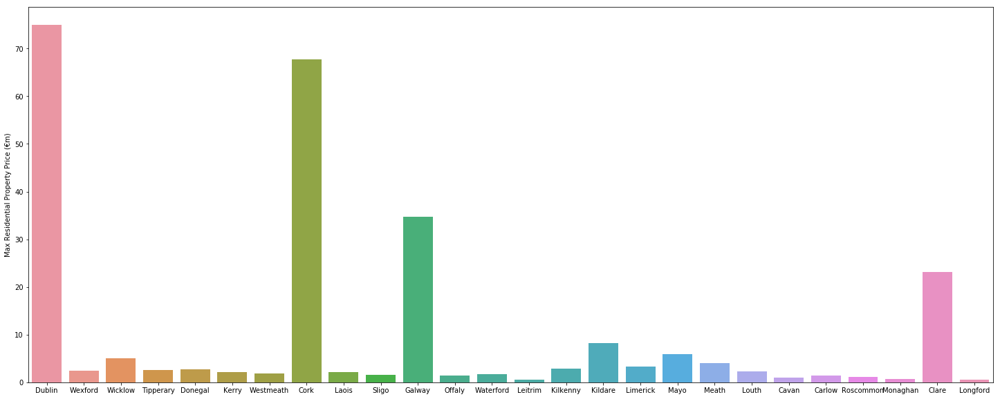

In [67]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Max Residential Property Price (€m)')
sns.barplot(df['County'].unique(), max_house_prices)

In [62]:
min_house_prices = [(df[df['County'] == county]['Price'].min()) for county in df['County'].unique()]

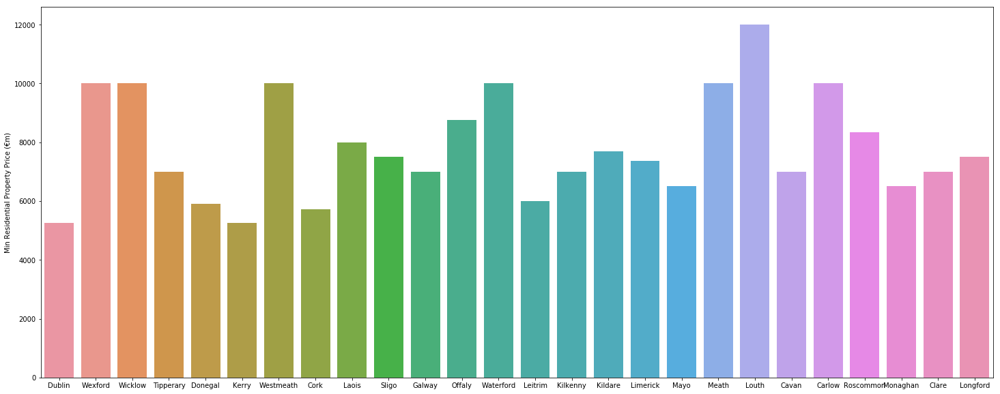

In [68]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Min Residential Property Price (€m)')
sns.barplot(df['County'].unique(), min_house_prices)


Further steps:
- Dig deeper into what the max house prices are (Clare home sold for 23m??? - must be apartment block)
- Number of homes sold in Dublin and surrounding regions vs. rest of ireland (are the inflated prices of homes causing more people to move further away from Dublin? - could be an analysis of 2017 vs. 2018)
- Did new homes sell for much greater than 2nd hand homes? Were there many new homes or are people generally buying pre-existing homes? (measure no. of new homes being built) How significant is new/2nd hand in the actual price of the home?
- Which postal code in Dublin has the most expensive homes? The cheapest? Where are the middle class best represented?
- Effect of property size on house price (presumably bigger homes sell for more)

In [69]:
df[df['Price'] == df[df['County'] == 'Clare']['Price'].max()]['Address'].values

array(['APT 1 CAPPAVILLA VILLAGE, UNIVERSITY OF LIMERICK GARRAUN, CLONLARA'],
      dtype=object)

Presumably, this is an entire apartment block. From the Property Price Register site: "Where a number of apartments are sold for a single price (e.g. Apartments Nos 1 to 15 Oak Drive are sold for €2m), the information on the Register depends on what was filed with the Revenue Commissioners." Looking at the other highly priced properties in other counties

In [70]:
df[df['Price'] == df[df['County'] == 'Kildare']['Price'].max()]['Address'].values

array(['1 RATHASKER COURT, WHITEWATER PLAZA, NEWBRIDGE'], dtype=object)

This looks like a big house in Kildare.

In [71]:
df[df['Price'] == df[df['County'] == 'Galway']['Price'].max()]['Address'].values

array(['Student Accomodation known as, Cuirt Na Coiribe  Headford Road'],
      dtype=object)

Large student accomodation.

In [72]:
df[df['Price'] == df[df['County'] == 'Cork']['Price'].max()]['Address'].values

array(['1 THE ELYSIAN, EGLINTON STREET, CORK'], dtype=object)

Apartment block.

In [73]:
df[df['Price'] == df[df['County'] == 'Dublin']['Price'].max()]['Address'].values

array(['APT 1 JADE, THE GRANGE  BREWERY ROAD, STILLORGAN'], dtype=object)

Apartment block.

## Number of homes sold in Dublin and surrounding areas vs. the rest of the country

In [74]:
print('Number of homes sold in Dublin: {}'.format(len(df[df['County'] == 'Dublin'])))

Number of homes sold in Dublin: 33074


In [75]:
print('Number of homes sold in Dublin and surrounding areas: {}'.format(len(the_pale)))

Number of homes sold in Dublin and surrounding areas: 45742


In [77]:
print('Number of homes sold in rest of country: {}'.format(len(rest_of_ireland)))

Number of homes sold in rest of country: 54557


## New homes vs. second hand homes

In [78]:
df.head()

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
0,2018-01-02,"1 ABBEY ST, HOWTH, DUBLIN",Dublin 7,Dublin,710000.0,No,Second-Hand Dwelling house /Apartment,None,53.388117,-6.064608
1,2018-01-02,"1 Cluain na Ri, Ballycullane, New Ross",None,Wexford,193833.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,52.291685,-6.824370
2,2018-01-02,"1 ROSEVILLE, LOWER ROAD, SHANKILL",Dublin 18,Dublin,627230.7,No,Second-Hand Dwelling house /Apartment,None,53.232940,-6.125343
3,2018-01-02,"11 Castlelynn, Soldiers Road, Bray",None,Wicklow,545000.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,53.192040,-6.117972
4,2018-01-02,"12 HEYWOOD DR, ARD GAOITHE, CLONMEL",None,Tipperary,150000.0,No,Second-Hand Dwelling house /Apartment,None,52.364474,-7.714268


In [79]:
len(df[df['Description of Property'] == 'Second-Hand Dwelling house /Apartment'])

81886

In [80]:
len(df[df['Description of Property'] == 'New Dwelling house /Apartment'])

18413

In [81]:
df[df['Description of Property'] == 'Second-Hand Dwelling house /Apartment']['Price'].mean()/10**3

273.52171371772954

In [82]:
df[df['Description of Property'] == 'Second-Hand Dwelling house /Apartment']['Price'].median()/10**3

207.0

In [83]:
df[df['Description of Property'] == 'Second-Hand Dwelling house /Apartment']['Price'].std()/10**3

543.1080599920064

In [84]:
df[df['Description of Property'] == 'New Dwelling house /Apartment']['Price'].mean()/10**3

318.594594060718

In [85]:
df[df['Description of Property'] == 'New Dwelling house /Apartment']['Price'].median()/10**3

280.63011

In [86]:
df[df['Description of Property'] == 'New Dwelling house /Apartment']['Price'].std()/10**3

573.8080290925061

## Plotting home coordinates

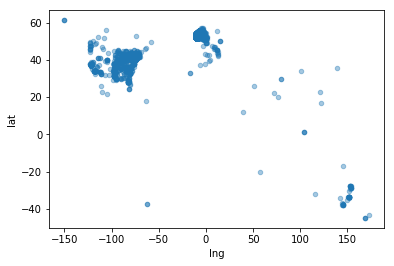

In [87]:
df.plot(kind="scatter", x="lng", y="lat", alpha=0.4)
plt.show()

In [88]:
df.head()

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
0,2018-01-02,"1 ABBEY ST, HOWTH, DUBLIN",Dublin 7,Dublin,710000.0,No,Second-Hand Dwelling house /Apartment,None,53.388117,-6.064608
1,2018-01-02,"1 Cluain na Ri, Ballycullane, New Ross",None,Wexford,193833.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,52.291685,-6.824370
2,2018-01-02,"1 ROSEVILLE, LOWER ROAD, SHANKILL",Dublin 18,Dublin,627230.7,No,Second-Hand Dwelling house /Apartment,None,53.232940,-6.125343
3,2018-01-02,"11 Castlelynn, Soldiers Road, Bray",None,Wicklow,545000.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,53.192040,-6.117972
4,2018-01-02,"12 HEYWOOD DR, ARD GAOITHE, CLONMEL",None,Tipperary,150000.0,No,Second-Hand Dwelling house /Apartment,None,52.364474,-7.714268


In [89]:
df[df['lng'] > 0]

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
421,2018-01-08,"PRAGUE, JOHNSTOWN COURT, DUN LAOGHAIRE",None,Dublin,2020000.00,No,Second-Hand Dwelling house /Apartment,None,50.075538,14.437800
1128,2018-01-15,"BELLE MARE, KINAFFE, SWINFORD",None,Mayo,215000.00,No,Second-Hand Dwelling house /Apartment,None,-20.199581,57.777157
1315,2018-01-17,"4 LUCERNE, 39 CASTLE AVE, CLONTARF DUBLIN 3",Dublin 3,Dublin,325500.00,No,Second-Hand Dwelling house /Apartment,None,47.050168,8.309307
3122,2018-01-31,"JALNA, WHITEPOINT, COBH",None,Cork,325000.00,No,Second-Hand Dwelling house /Apartment,None,19.829689,75.880030
3374,2018-02-01,"THE VILLA, GARRYHINCH, PORTARLINGTON",None,Offaly,175000.00,No,Second-Hand Dwelling house /Apartment,None,-38.115730,144.651503
6882,2018-02-28,"AROSA, 4 CONGRESS PLACE, WILTON RD",None,Cork,400000.00,No,Second-Hand Dwelling house /Apartment,None,46.782370,9.679911
8876,2018-03-16,"Apartment 6, Orwell Place, Marianella",Dublin 6,Dublin,506607.00,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,52.052379,1.155473
9789,2018-03-23,"APT 2 WAVENEY HOUSE, 11 HARBOUR ROAD, HOWTH",None,Dublin,301000.00,No,Second-Hand Dwelling house /Apartment,None,52.392802,1.623991
11443,2018-04-06,"1 DUN BHRAIN, GLACK, LONGFORD",None,Longford,50000.00,No,Second-Hand Dwelling house /Apartment,None,26.066700,50.557700
14490,2018-04-27,"ST PAULS, CASTLE HILL, CARLOW",None,Carlow,97000.00,No,Second-Hand Dwelling house /Apartment,None,-33.727498,151.018624


In [90]:
df[(df['lng'] < -50) & (df['lat'] > 20)]

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
271,2018-01-05,"APARTMENTS 1 2 AND 3, STELLA MARIS, CHURCH ST...",None,Cork,270000.00,No,Second-Hand Dwelling house /Apartment,None,32.760731,-79.858486
367,2018-01-08,"5 Hamilton Avenue, Mount Hamilton, Carrick Road",None,Louth,198238.00,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,37.364832,-121.764076
641,2018-01-10,"APT 17, WELLINGTON SQ, WELLINGTON ST",None,Waterford,60000.00,No,Second-Hand Dwelling house /Apartment,None,36.329760,-94.162644
674,2018-01-11,"1 GLENSIDE, BARRACK ST, CAPPOQUIN",None,Waterford,350000.00,No,Second-Hand Dwelling house /Apartment,None,40.099908,-75.152793
830,2018-01-12,"10 Morristown Green, The Paddocks, Station Road",None,Kildare,289868.00,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,40.797009,-74.480999
947,2018-01-12,"65 LISDALE AVE, DRIMNAGH, DUBLIN 12",Dublin 12,Dublin,265000.00,No,Second-Hand Dwelling house /Apartment,None,44.885950,-93.286386
971,2018-01-12,"APT 3, CLEARWATER APTS, COAST RD",None,Dublin,525000.00,No,Second-Hand Dwelling house /Apartment,None,27.972969,-82.735162
1127,2018-01-15,"BEECH GROVE, IRRABEG, LIXNAW",None,Kerry,213000.00,No,Second-Hand Dwelling house /Apartment,None,39.721988,-86.089985
1195,2018-01-16,"3 THE MEWS &amp;amp; Others, LOWER GATE, CASHEL",None,Tipperary,425000.00,No,Second-Hand Dwelling house /Apartment,None,40.814656,-73.491775
1246,2018-01-16,"APT 9, SOUTHBROOK APTS, SOUTH TERRACE",None,Cork,155000.00,No,Second-Hand Dwelling house /Apartment,None,39.002785,-95.746069


Lat and lng inaccurate due to some inaccurate/incomplete addresses presumably.

Further steps:
- Dig deeper into what the max house prices are (Clare home sold for 23m??? - must be apartment block)
- Number of homes sold in Dublin and surrounding regions vs. rest of ireland (are the inflated prices of homes causing more people to move further away from Dublin? - could be an analysis of 2017 vs. 2018)
- Did new homes sell for much greater than 2nd hand homes? Were there many new homes or are people generally buying pre-existing homes? (measure no. of new homes being built) How significant is new/2nd hand in the actual price of the home?
- Which postal code in Dublin has the most expensive homes? The cheapest? Where are the middle class best represented?
- Effect of property size on house price (presumably bigger homes sell for more)

## Postal codes in Dublin

In [91]:
df[df['County'] == 'Dublin']['Postal Code'].unique()

array(['Dublin 7', 'Dublin 18', 'None', 'Dublin 12', 'Dublin 24',
       'Dublin 3', 'Dublin 9', 'Dublin 11', 'Dublin 16', 'Dublin 15',
       'Dublin 4', 'Dublin 5', 'Dublin 1', 'Dublin 8', 'Dublin 13',
       'Dublin 22', 'Dublin 2', 'Dublin 14', 'Dublin 6w', 'Dublin 6',
       'Dublin 20', 'Dublin 17', 'Dublin 10'], dtype=object)

In [92]:
for postal_code in df[df['County'] == 'Dublin']['Postal Code'].unique():
    print('Mean house price in {}: {:.2f}k'.format(postal_code, df['Price'][df['Postal Code']==postal_code].mean()/10**3))
    print('Standard deviation of house price in {}: {:.2f}k'.format(postal_code, df['Price'][df['Postal Code']==postal_code].std()/10**3))
    print('Median house price in {}: {:.2f}k'.format(postal_code, df['Price'][df['Postal Code']==postal_code].median()/10**3))
    print('_______________________________')
    

Mean house price in Dublin 7: 381.12k
Standard deviation of house price in Dublin 7: 633.01k
Median house price in Dublin 7: 326.00k
_______________________________
Mean house price in Dublin 18: 526.08k
Standard deviation of house price in Dublin 18: 540.32k
Median house price in Dublin 18: 401.00k
_______________________________
Mean house price in None: 241.95k
Standard deviation of house price in None: 503.10k
Median house price in None: 195.00k
_______________________________
Mean house price in Dublin 12: 332.49k
Standard deviation of house price in Dublin 12: 103.70k
Median house price in Dublin 12: 315.00k
_______________________________
Mean house price in Dublin 24: 276.14k
Standard deviation of house price in Dublin 24: 212.63k
Median house price in Dublin 24: 256.00k
_______________________________
Mean house price in Dublin 3: 481.39k
Standard deviation of house price in Dublin 3: 355.96k
Median house price in Dublin 3: 385.02k
_______________________________
Mean house pr

In [93]:
post_codes = np.delete(df[df['County'] == 'Dublin']['Postal Code'].unique(), 2)

In [94]:
post_codes

array(['Dublin 7', 'Dublin 18', 'Dublin 12', 'Dublin 24', 'Dublin 3',
       'Dublin 9', 'Dublin 11', 'Dublin 16', 'Dublin 15', 'Dublin 4',
       'Dublin 5', 'Dublin 1', 'Dublin 8', 'Dublin 13', 'Dublin 22',
       'Dublin 2', 'Dublin 14', 'Dublin 6w', 'Dublin 6', 'Dublin 20',
       'Dublin 17', 'Dublin 10'], dtype=object)

In [95]:
mean_per_postal_code = [df['Price'][df['Postal Code']==postal_code].mean() for postal_code in post_codes]
std_per_postal_code = [df['Price'][df['Postal Code']==postal_code].std() for postal_code in post_codes]
median_per_postal_code = [df['Price'][df['Postal Code']==postal_code].median() for postal_code in post_codes]

In [96]:
mean_per_postal_code

[381117.6309219191,
 526080.076158192,
 332490.62793933053,
 276141.3267119411,
 481389.5347301952,
 410485.4121488373,
 302656.0915865385,
 472215.4765737052,
 353830.2609960868,
 818619.157393321,
 392270.5184869326,
 373712.34,
 383949.1267429022,
 391006.24580775446,
 255119.84313364053,
 518283.0599321267,
 589985.4363064833,
 619274.915,
 780849.9846265761,
 334440.2354424779,
 240820.08340206186,
 215924.6633170732]

In [97]:
mean_per_postal_code = np.asarray(mean_per_postal_code)
std_per_postal_code = np.asarray(std_per_postal_code)
median_per_postal_code = np.asarray(median_per_postal_code)

In [98]:
np.array([mean_per_postal_code, df[df['County'] == 'Dublin']['Postal Code'].unique()])

array([array([381117.63092192, 526080.07615819, 332490.62793933, 276141.32671194,
       481389.5347302 , 410485.41214884, 302656.09158654, 472215.47657371,
       353830.26099609, 818619.15739332, 392270.51848693, 373712.34      ,
       383949.1267429 , 391006.24580775, 255119.84313364, 518283.05993213,
       589985.43630648, 619274.915     , 780849.98462658, 334440.23544248,
       240820.08340206, 215924.66331707]),
       array(['Dublin 7', 'Dublin 18', 'None', 'Dublin 12', 'Dublin 24',
       'Dublin 3', 'Dublin 9', 'Dublin 11', 'Dublin 16', 'Dublin 15',
       'Dublin 4', 'Dublin 5', 'Dublin 1', 'Dublin 8', 'Dublin 13',
       'Dublin 22', 'Dublin 2', 'Dublin 14', 'Dublin 6w', 'Dublin 6',
       'Dublin 20', 'Dublin 17', 'Dublin 10'], dtype=object)],
      dtype=object)

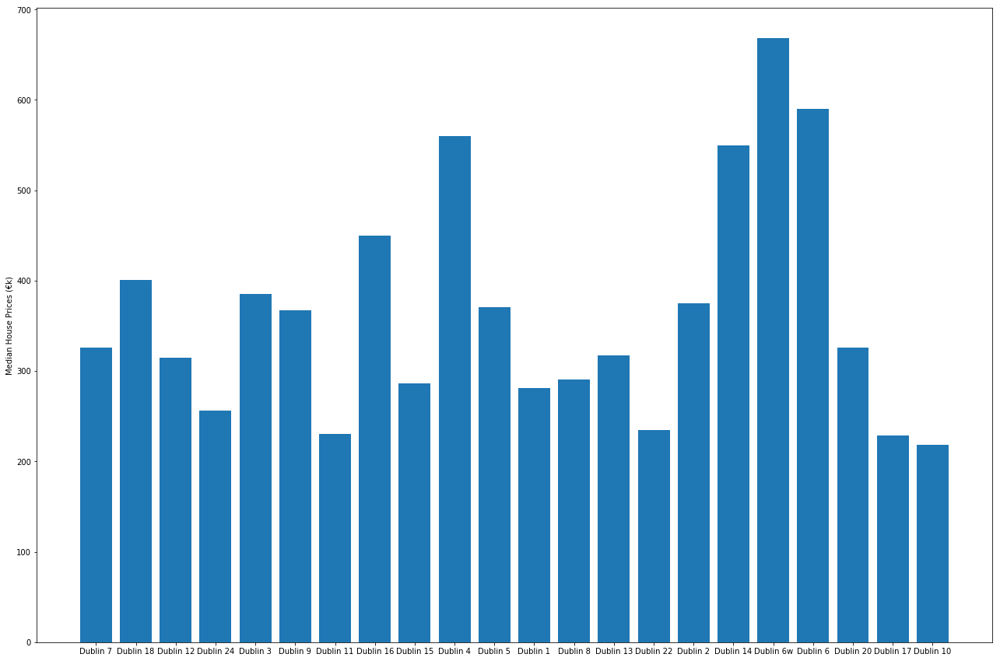

In [117]:
fig, ax = plt.subplots(figsize=(22, 15))
# plt.errorbar(post_codes,mean_per_postal_code, std_per_postal_code, linestyle='None', marker='*',
plt.bar(post_codes,[price/10**3 for price in median_per_postal_code])
plt.ylabel('Median House Prices (€k)')
plt.show()

## Effect of Property Size on Price

In [100]:
df.head()

,Date of Sale,Address,Postal Code,County,Price,VAT Exclusive,Description of Property,Property Size Description,lat,lng
0,2018-01-02,"1 ABBEY ST, HOWTH, DUBLIN",Dublin 7,Dublin,710000.0,No,Second-Hand Dwelling house /Apartment,None,53.388117,-6.064608
1,2018-01-02,"1 Cluain na Ri, Ballycullane, New Ross",None,Wexford,193833.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,52.291685,-6.824370
2,2018-01-02,"1 ROSEVILLE, LOWER ROAD, SHANKILL",Dublin 18,Dublin,627230.7,No,Second-Hand Dwelling house /Apartment,None,53.232940,-6.125343
3,2018-01-02,"11 Castlelynn, Soldiers Road, Bray",None,Wicklow,545000.0,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,53.192040,-6.117972
4,2018-01-02,"12 HEYWOOD DR, ARD GAOITHE, CLONMEL",None,Tipperary,150000.0,No,Second-Hand Dwelling house /Apartment,None,52.364474,-7.714268


In [101]:
df['Property Size Description'].unique()

array(['None', 'greater than or equal to 125 sq metres',
       'greater than or equal to 38 sq metres and less than 125 sq metres',
       'less than 38 sq metres'], dtype=object)

In [102]:
df['Property Size Description'].value_counts()

None                                                                 82282
greater than or equal to 38 sq metres and less than 125 sq metres    13475
greater than or equal to 125 sq metres                                3711
less than 38 sq metres                                                 831
Name: Property Size Description, dtype: int64

In [103]:
property_sizes = np.delete(df['Property Size Description'].unique(), 0)

In [104]:
property_sizes

array(['greater than or equal to 125 sq metres',
       'greater than or equal to 38 sq metres and less than 125 sq metres',
       'less than 38 sq metres'], dtype=object)

In [105]:
df[df['Property Size Description'] == 'greater than or equal to 38 sq metres and less than 125 sq metres']['Price'].mean()

294762.4133239332

In [106]:
df[df['Property Size Description'] == 'greater than or equal to 38 sq metres and less than 125 sq metres']['Price'].std()

428441.225407424

In [107]:
df[df['Property Size Description'] == 'greater than or equal to 38 sq metres and less than 125 sq metres']['Price'].median()

271411.0

In [108]:
df[df['Property Size Description'] == 'greater than or equal to 125 sq metres']['Price'].mean()

416868.9131473996

In [109]:
df[df['Property Size Description'] == 'greater than or equal to 125 sq metres']['Price'].std()

972537.5872606672

In [110]:
df[df['Property Size Description'] == 'greater than or equal to 125 sq metres']['Price'].median()

330396.29

In [111]:
df[df['Property Size Description'] == 'less than 38 sq metres']['Price'].mean()

260528.65930204574

In [112]:
df[df['Property Size Description'] == 'less than 38 sq metres']['Price'].std()

157785.59277621013

In [113]:
df[df['Property Size Description'] == 'less than 38 sq metres']['Price'].median()

255507.0

In [114]:
median_per_property_size = [df['Price'][df['Property Size Description']==property_size].median() for property_size in property_sizes]

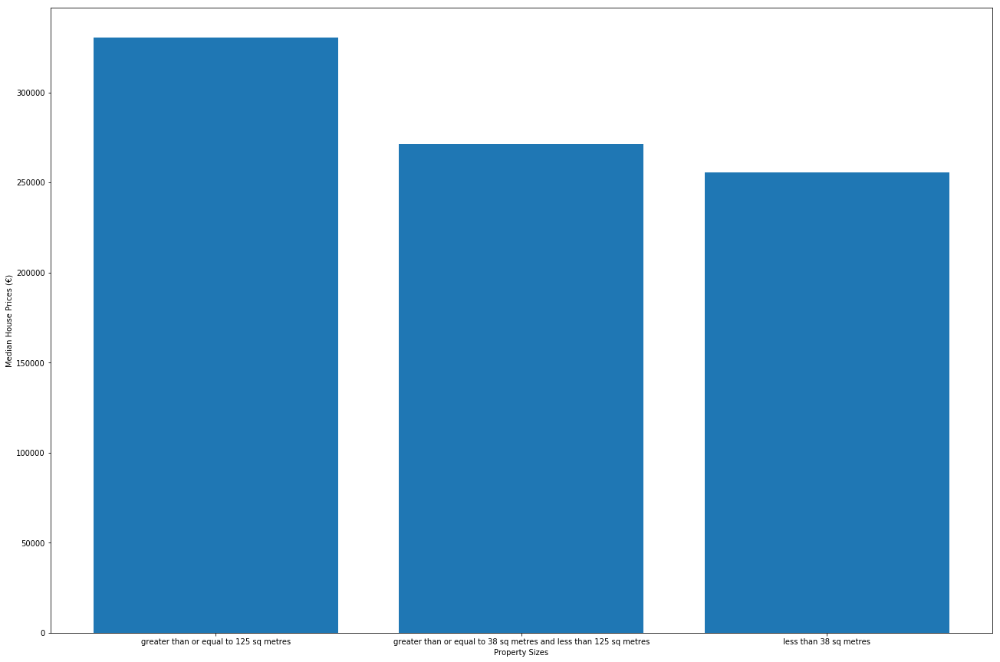

In [115]:
fig, ax = plt.subplots(figsize=(22, 15))
# plt.errorbar(post_codes,mean_per_postal_code, std_per_postal_code, linestyle='None', marker='*',
plt.bar(property_sizes,median_per_property_size)
plt.xlabel('Property Sizes')
plt.ylabel('Median House Prices (€)')
plt.show()